In [1]:
cd((@__DIR__) * raw"\..")
include("../table_reader.jl")
include("../utils/Missing_values.jl")

ImputeMissingValues!

In [2]:
series=extract_series("TX_STAID000737.txt",plot=false)
series=truncate_MV(series,"TX")
years=unique(Dates.year.(series.DATE))

include("../utils/Simulation.jl")
Days_list=GatherYearScenario(series[!,2],series.DATE)
avg_day=mean.(Days_list)
max_day=maximum.(Days_list)
df_month = @chain series begin
    @transform(:TEMP = series[!,2]) #Give a common name for TX, TN, etc...
    @transform(:MONTH = month.(:DATE)) #add month column
    @by(:MONTH, :MONTHLY_MEAN = mean(:TEMP), :MONTHLY_STD = std(:TEMP), :MONTHLY_MAX = maximum(:TEMP)) # grouby MONTH + takes the mean/std in each category 
end

#Imputing missing values
# include("utils/Missing_values.jl")
# ImputeMissingValues!(series[!,2],series.DATE)
# N=length(series[!,2])

Row,MONTH,MONTHLY_MEAN,MONTHLY_STD,MONTHLY_MAX
,Int64,Float64,Float64,Float64
1,1,5.72561,4.27158,15.2
2,2,6.92369,4.30074,19.0
3,3,10.4113,4.13513,24.8
4,4,13.9756,4.33257,27.9
5,5,17.7996,4.37329,31.7
6,6,20.7504,4.25252,34.8
7,7,22.8692,4.1839,41.5
8,8,22.9127,3.89454,37.1
9,9,19.88,3.64365,35.1


## I. Series filtered by removing a trigonometric periodicity

In [3]:
include("../utils/periodicity.jl")
trigo_function, param = fitted_periodicity_fonc(series[!, 2], series.DATE, OrderTrig=5, return_parameters=true)
periodicity = trigo_function.(series.DATE)
x = series[!, 2] - periodicity
period = trigo_function.(Date(0):Date(1)-Day(1))

366-element Vector{Float64}:
 5.95626559449946
 5.937818208974048
 5.920147076647565
 5.903227406717607
 5.887047152306769
 5.871606957983623
 5.856920015476048
 5.84301182910718
 5.829919893112371
 5.817693283605852
 ⋮
 6.145624227765594
 6.118240818271298
 6.092296561424421
 6.067671548823256
 6.044255588973163
 6.021948885804535
 6.000662637298354
 5.980319550501548
 5.96085426981196

## Segmenting the dataset by month

## Autocorrelations

For each month, it still looks like an AR(1) model

# Estimation AR(1)

## Estimation

ERROR: LoadError: too many parameters for type AbstractInterpolation
Stacktrace:
 [1] top-level scope
   @ C:\Users\goninarn\.julia\packages\SparseConnectivityTracer\litqn\ext\SparseConnectivityTracerDataInterpolationsExt.jl:28
 [2] include
   @ .\Base.jl:557 [inlined]
 [3] include_package_for_output(pkg::Base.PkgId, input::String, depot_path::Vector{String}, dl_load_path::Vector{String}, load_path::Vector{String}, concrete_deps::Vector{Pair{Base.PkgId, UInt128}}, source::String)
   @ Base .\loading.jl:2881
 [4] top-level scope
   @ stdin:6
in expression starting at C:\Users\goninarn\.julia\packages\SparseConnectivityTracer\litqn\ext\SparseConnectivityTracerDataInterpolationsExt.jl:3
in expression starting at stdin:6
┌ Error: Error during loading of extension SparseConnectivityTracerDataInterpolationsExt of SparseConnectivityTracer, use `Base.retry_load_extensions()` to retry.
│   exception = 1-element ExceptionStack:
Failed to precompile SparseConnectivityTracerDataInterpolationsExt [

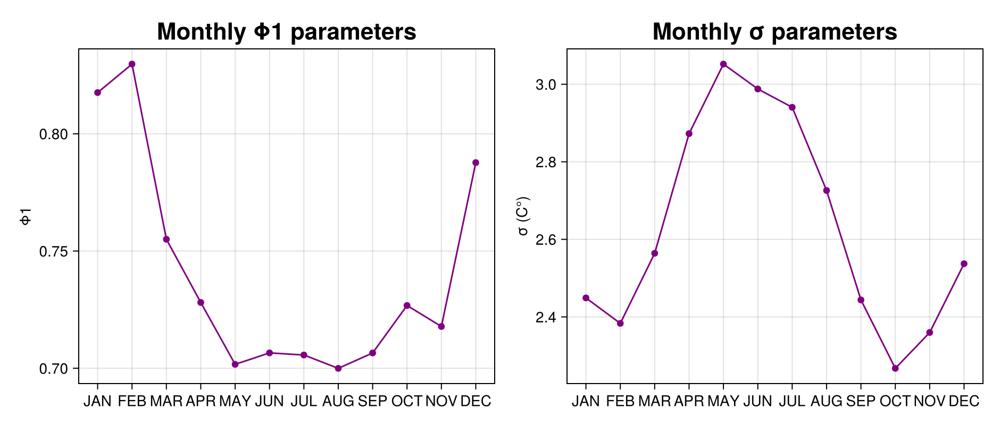

In [4]:
include(raw"..\utils\Estimation.jl")
Params= AllEstimation(x, Date_vec=series.DATE, plot = false)
Φ_month,σ_month=TakeParameters(Params,"monthlyLL")
PlotMonthlyparams([invert(Φ_month) ; [σ_month]])

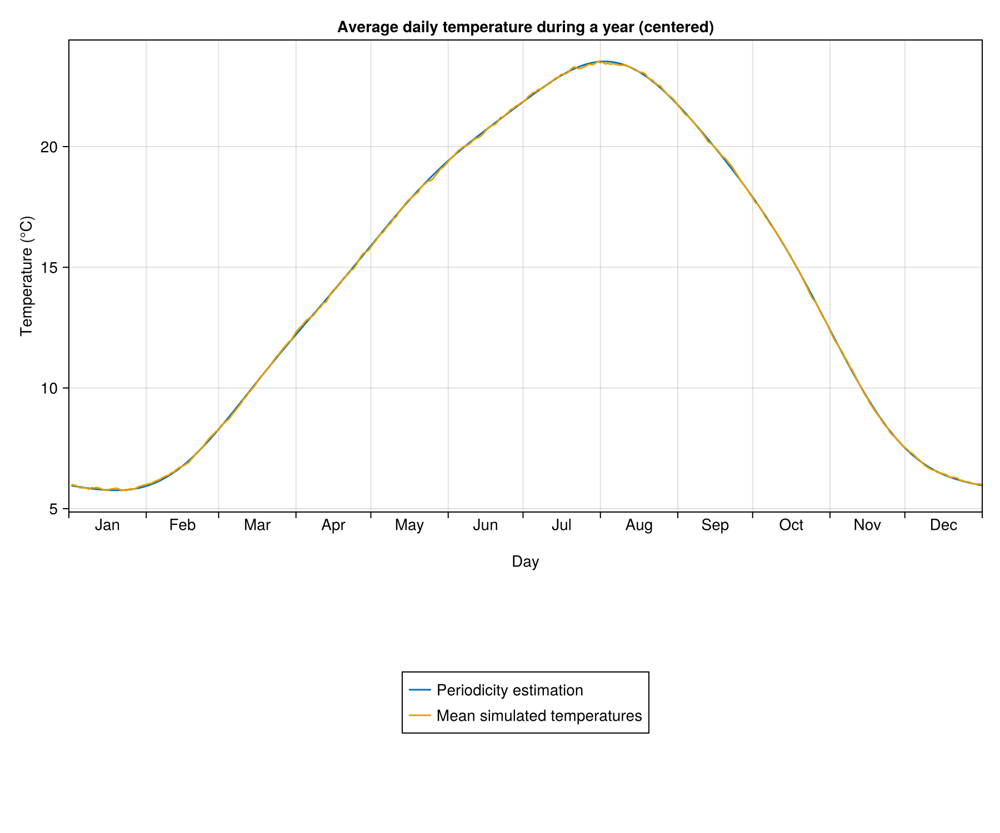

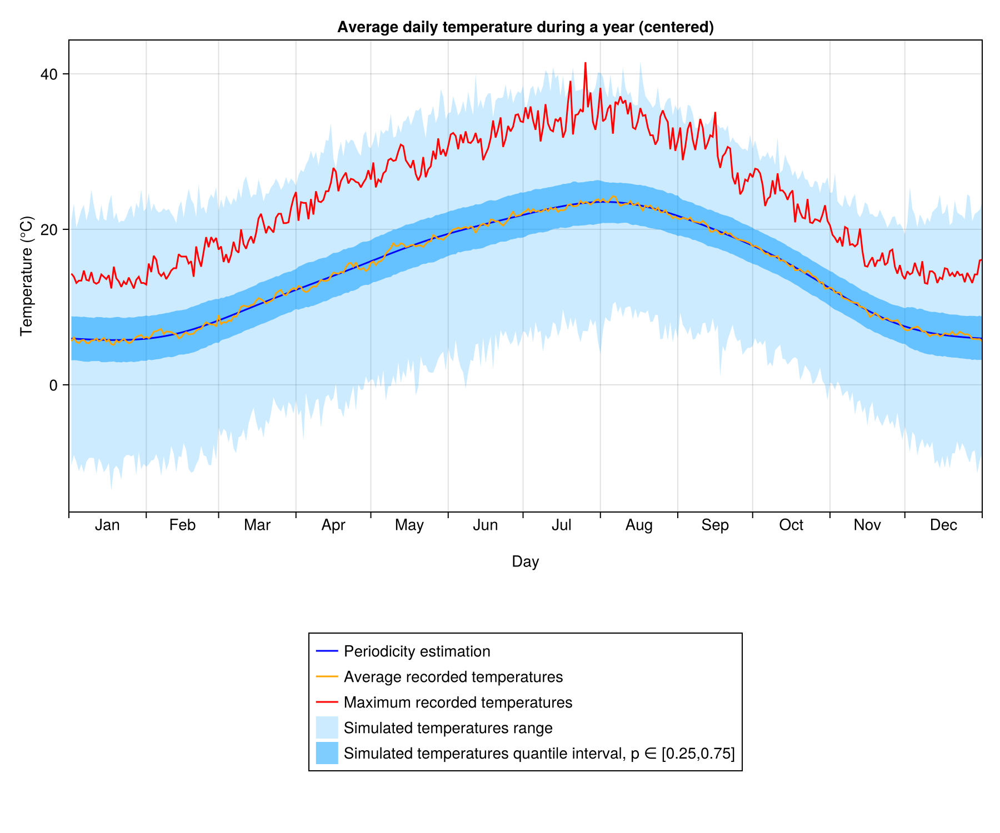

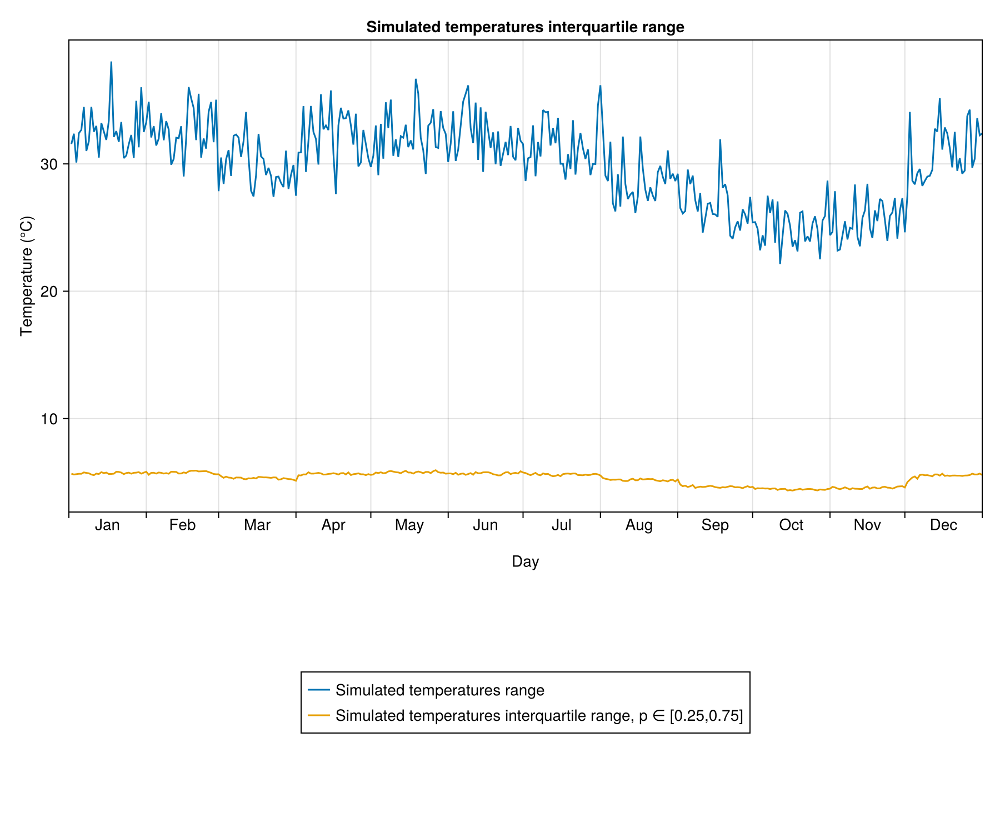

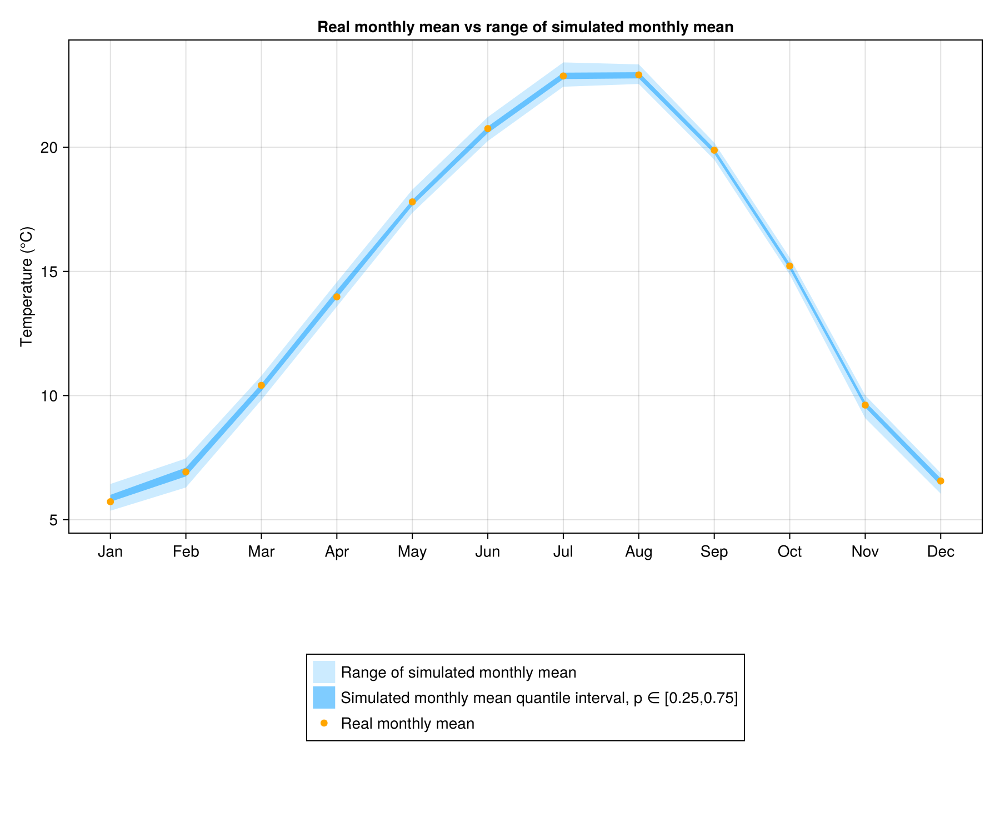

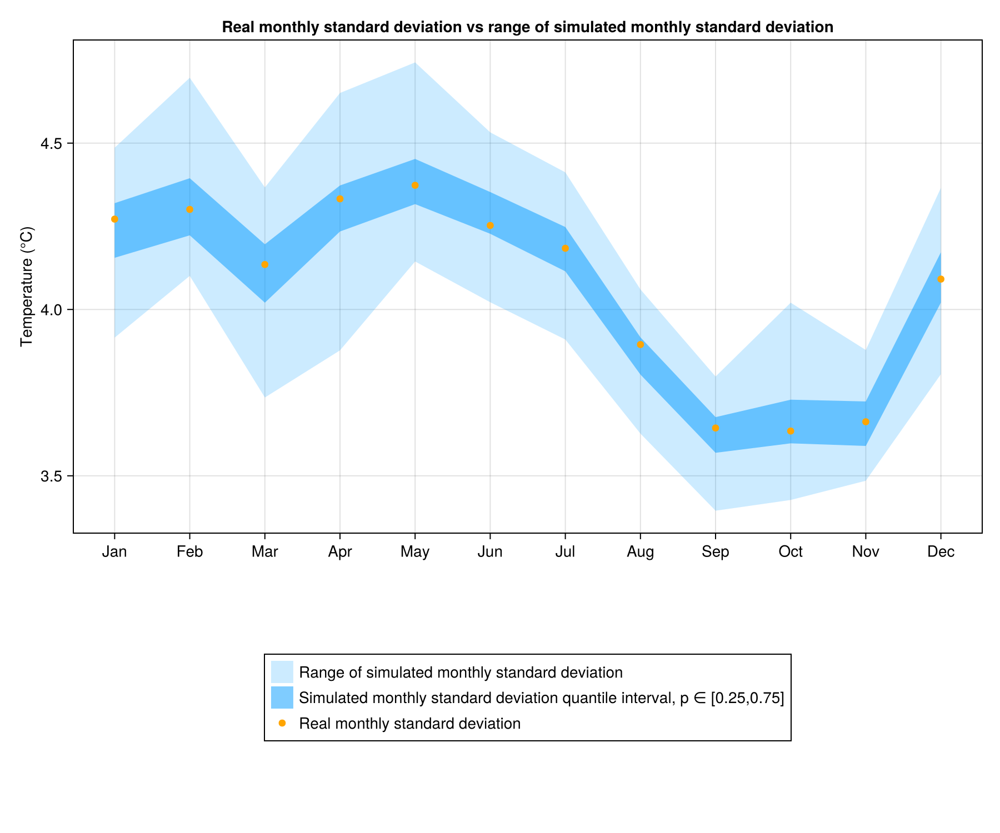

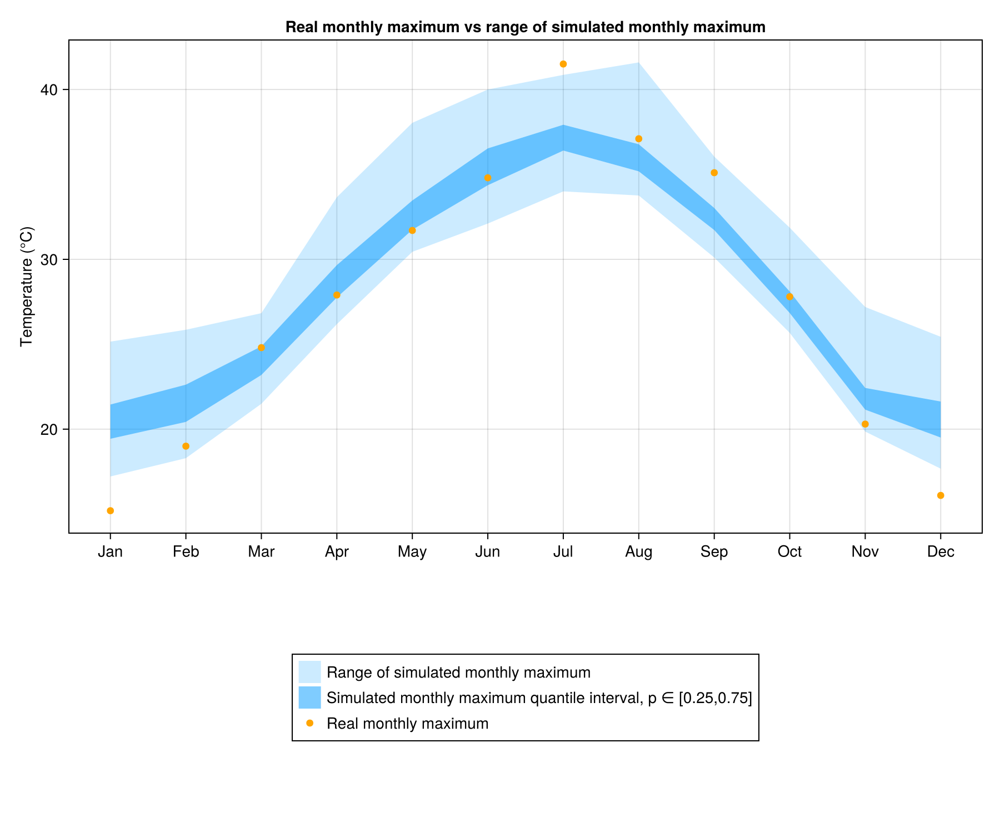

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x00000173a61fcb80, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000001

In [5]:
include("../utils/Plotting.jl")
sample_ = SimulateScenarios(x[1],series.DATE[1]:series.DATE[end],Φ_month,σ_month,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))

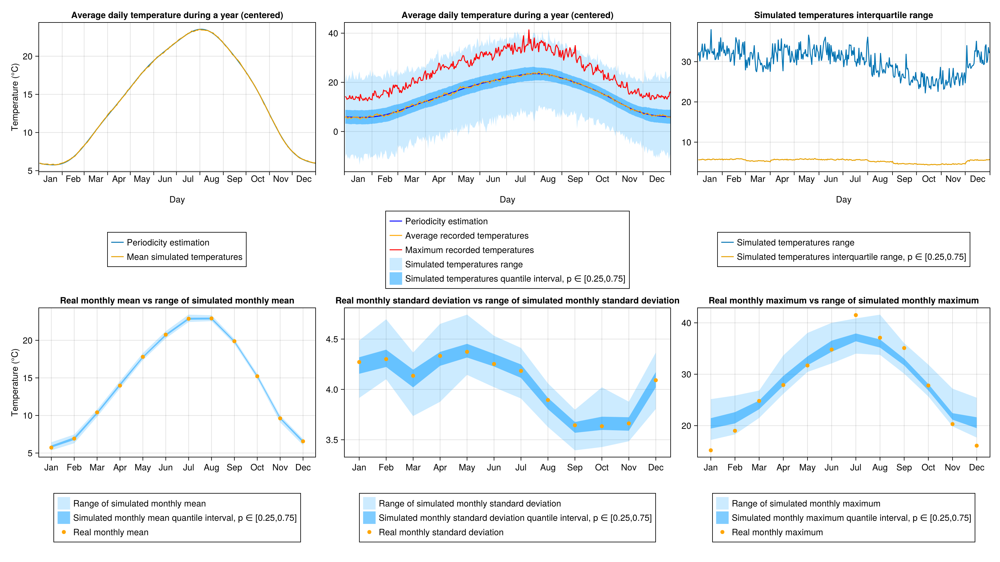

In [6]:
include("../utils/Plotting.jl")
Sample_diagnostic(sample_, series.DATE, period, avg_day, max_day, df_month, format_ = "horizontal")

# With LOESS

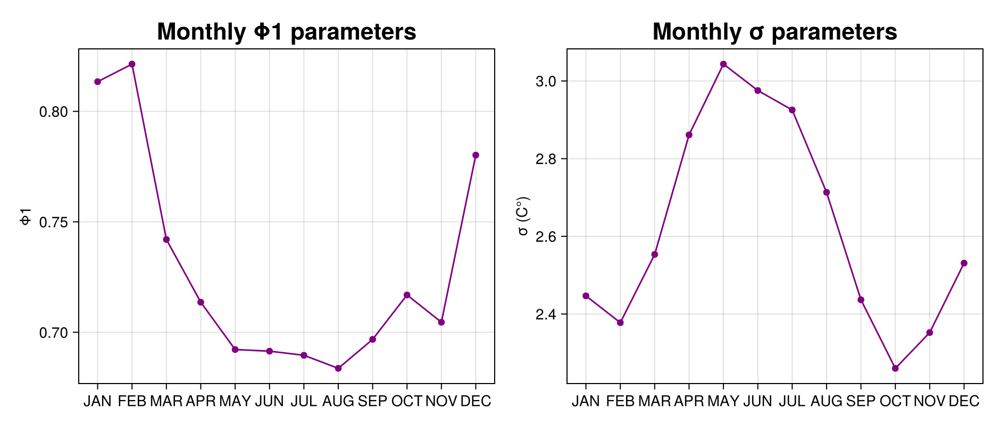

In [7]:
include("../utils/Trend.jl")
include("../utils/periodicity.jl")
include(raw"..\utils\Estimation.jl")
x = series[!, 2]
trend = LOESS(x)
trigo_function = fitted_periodicity_fonc(x - trend, series.DATE, OrderTrig=5)
periodicity,period = trigo_function.(series.DATE), trigo_function.(Date(0):(Date(1)-Day(1)))
z = x - trend - periodicity
nspart = trend + periodicity
Params= AllEstimation(z, Date_vec=series.DATE, plot = false)
Φ_month,σ_month=TakeParameters(Params,"monthlyLL")
PlotMonthlyparams([invert(Φ_month) ; [σ_month]])

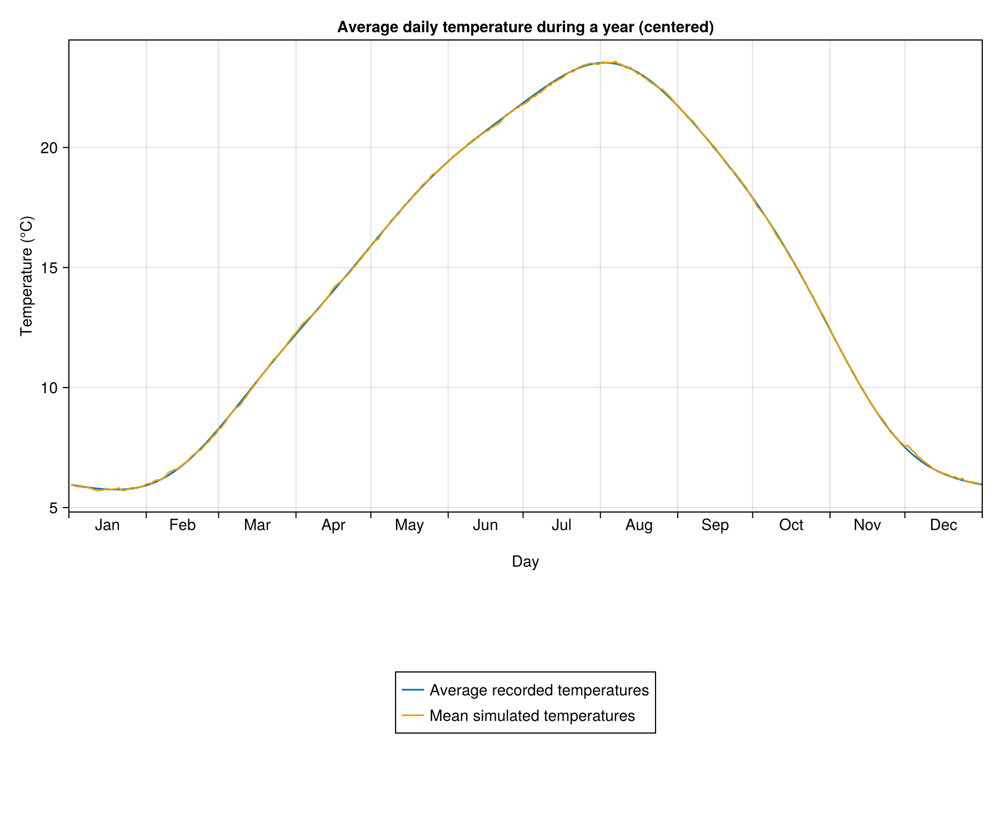

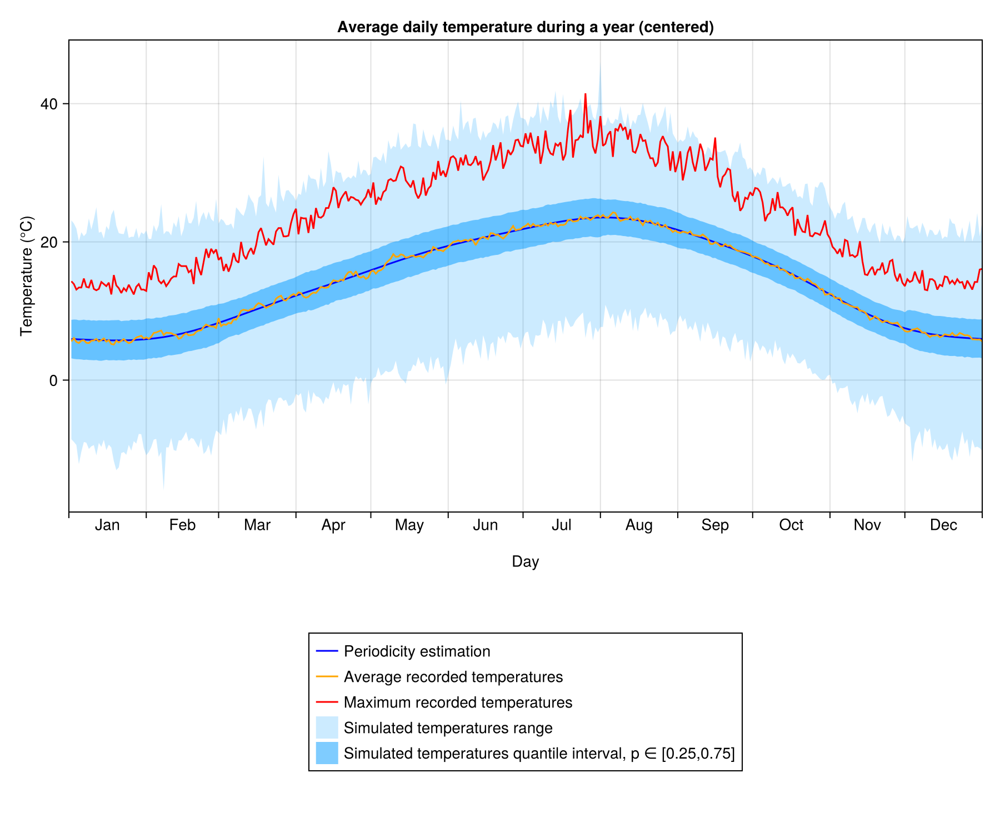

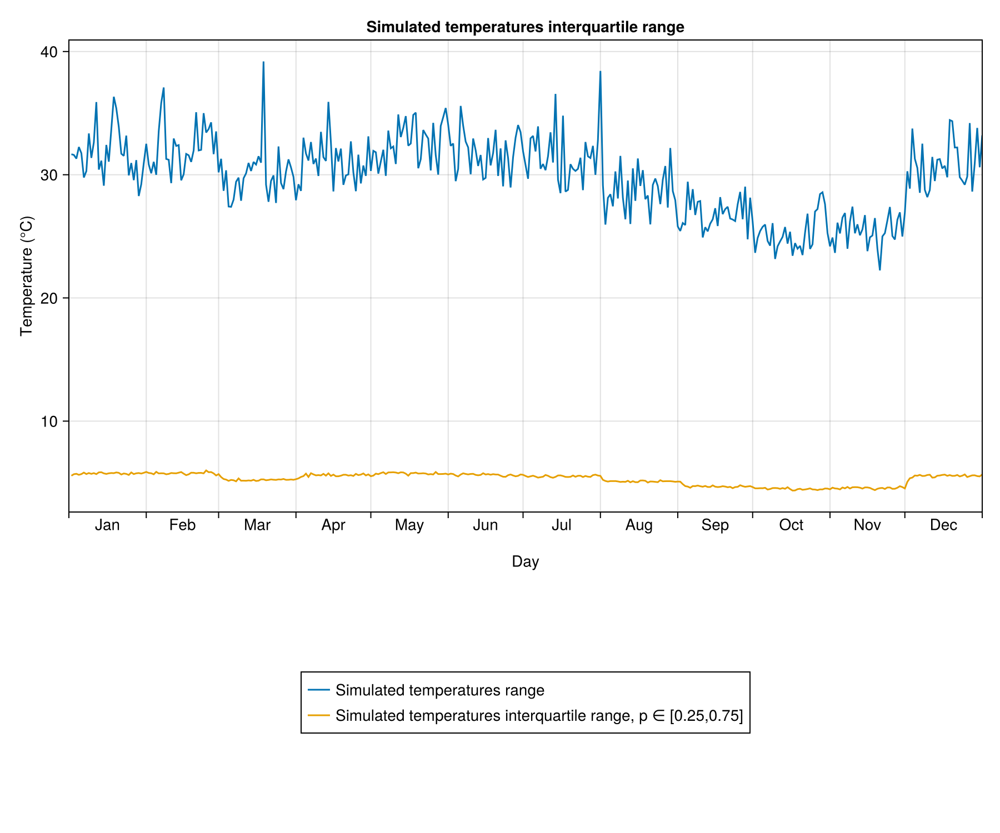

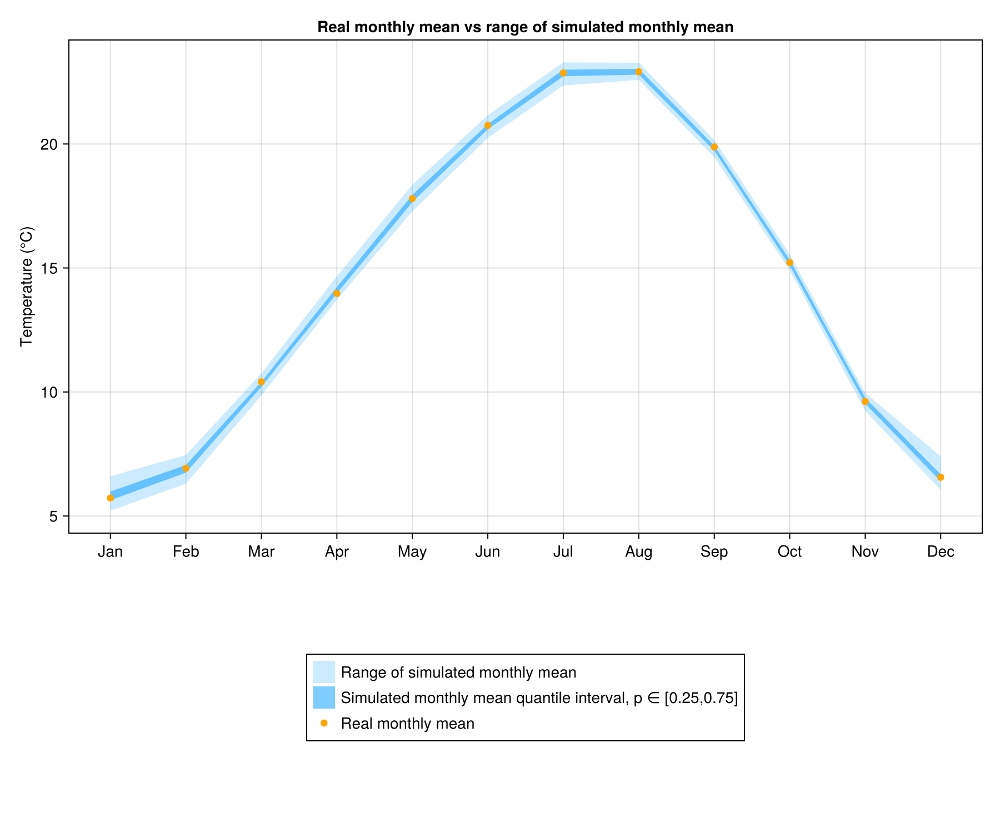

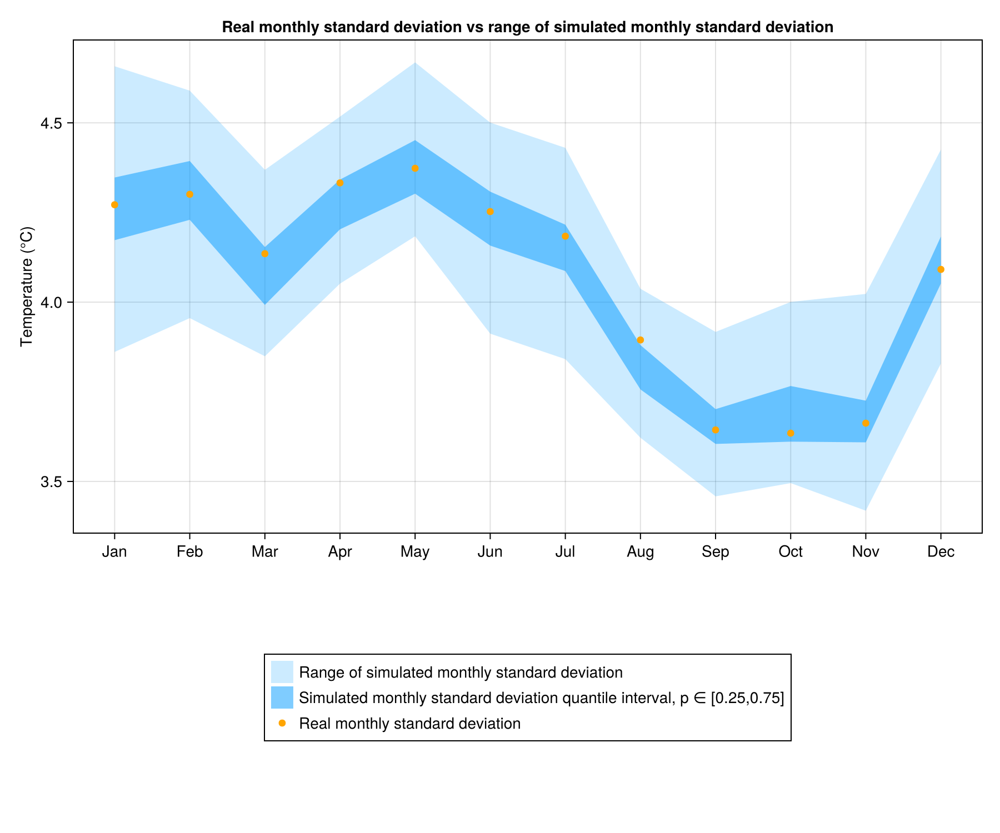

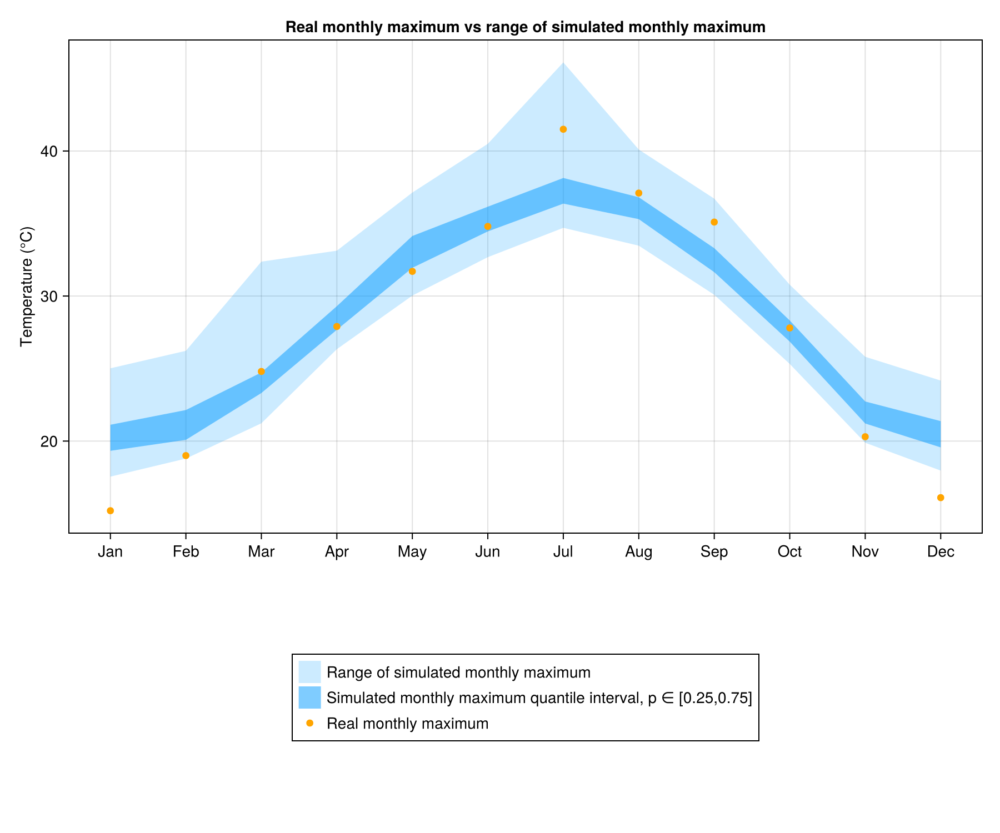

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x00000173a2563cb0, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000001

In [8]:
sample_ = SimulateScenarios(x[1],series.DATE[1]:series.DATE[end],Φ_month,σ_month,nspart,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period .+ mean(trend),mean.(year_sample)],["Average recorded temperatures","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period .+ mean(trend),avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))

# With LOESS (structure)

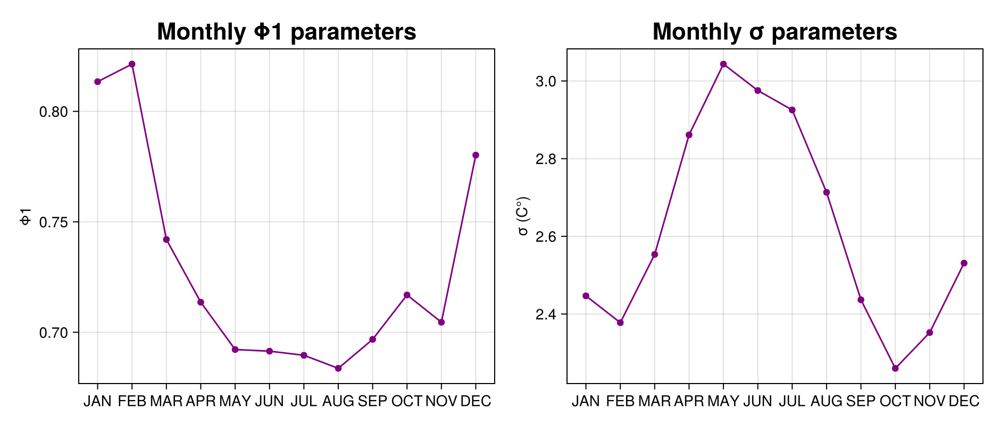

In [9]:
include("../utils/Structure.jl")
x = series[!, 2]
Model = fit_MonthlyAR(x, series.DATE)
PlotMonthlyparams([invert(Model.Φ) ; [Model.σ]])

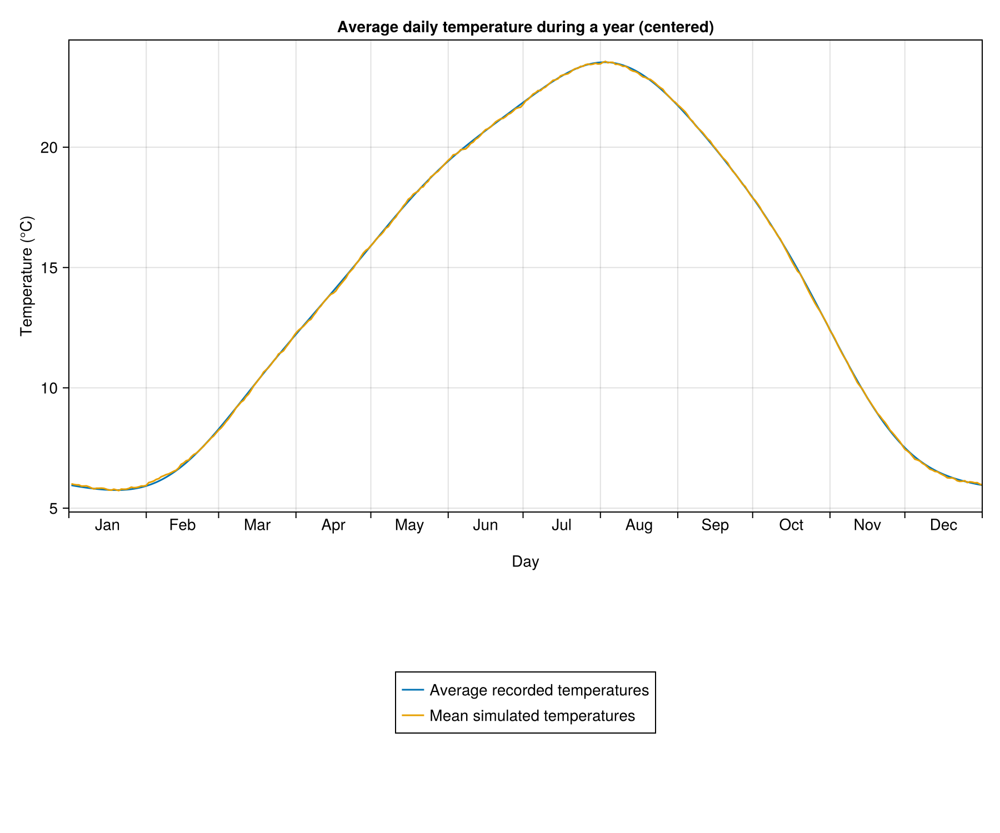

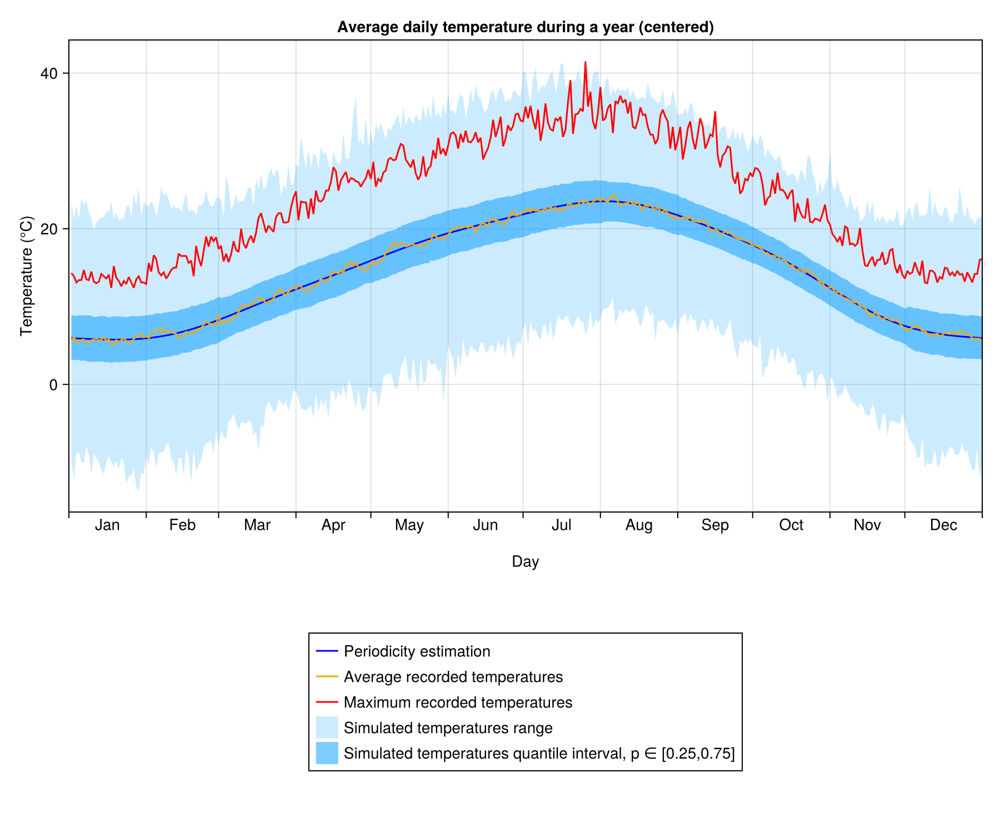

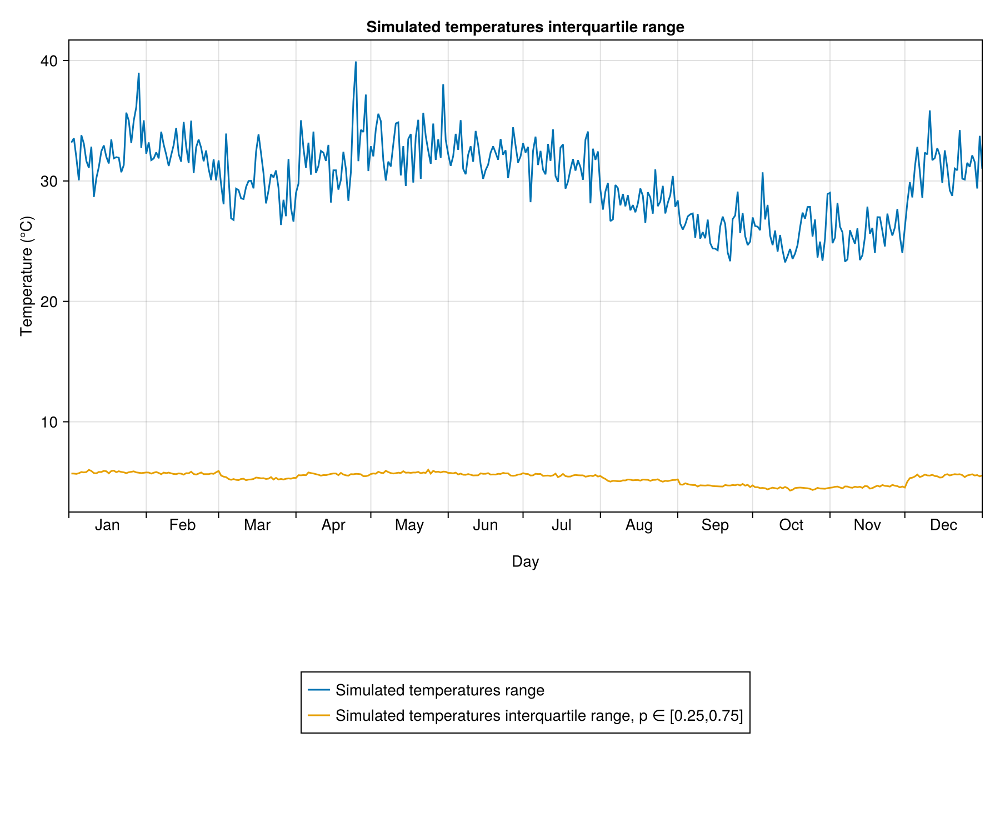

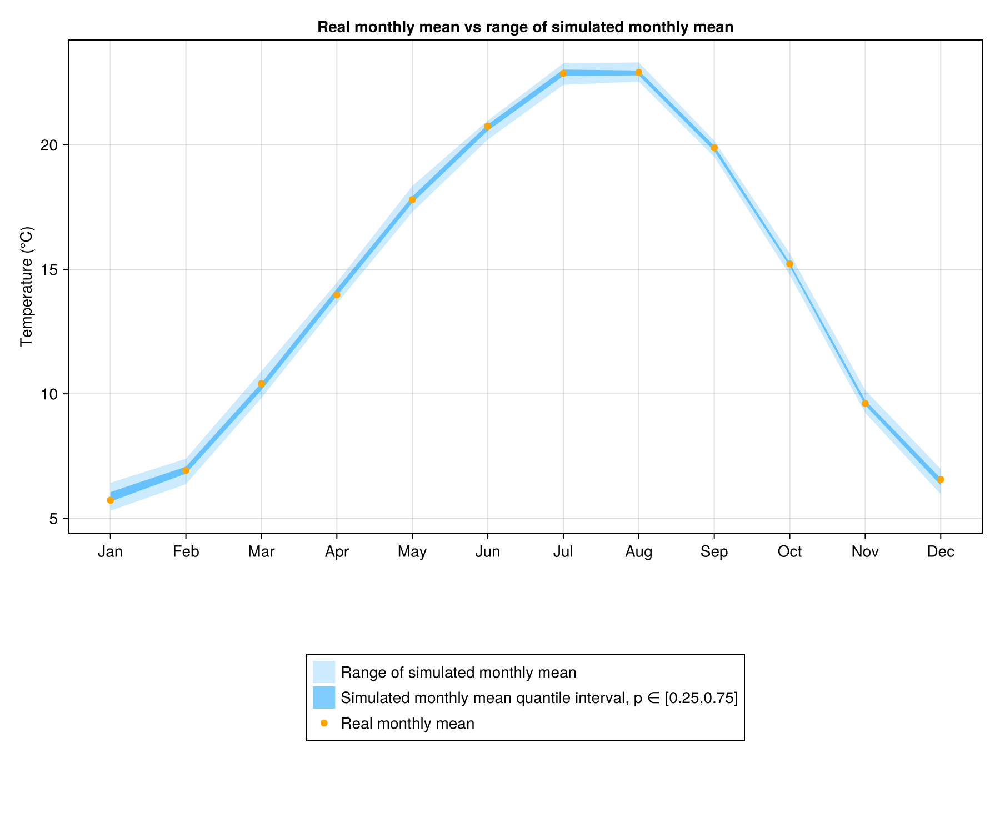

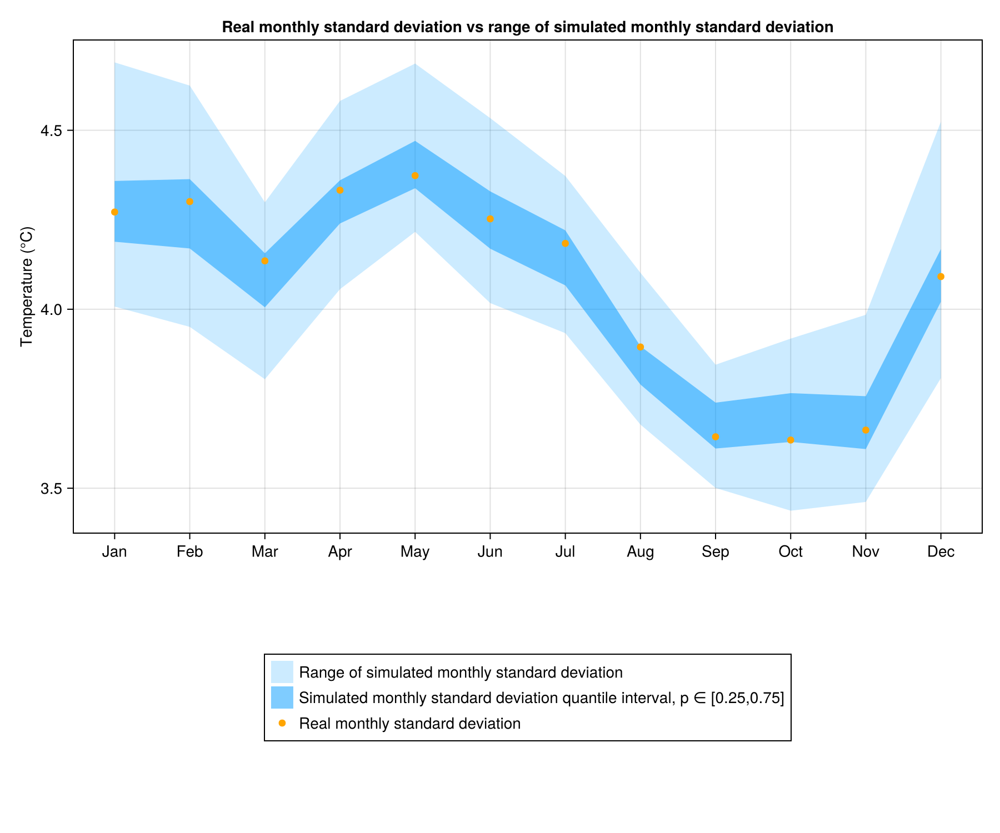

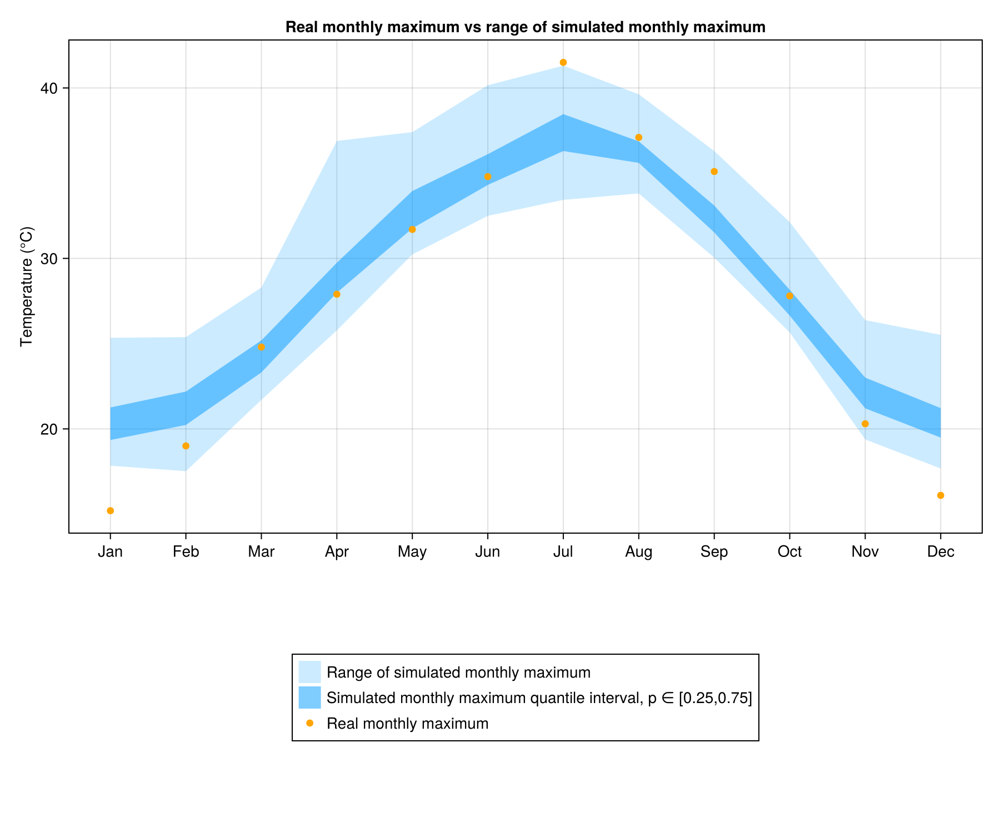

(CairoMakie.Screen{CairoMakie.IMAGE}(Scene (900px, 750px):
  0 Plots
  2 Child Scenes:
    ├ Scene (900px, 750px)
    └ Scene (900px, 750px), Cairo.CairoSurfaceImage{ColorTypes.ARGB32}(Ptr{Nothing} @0x00000173a2567f30, 1800.0, 1500.0, ColorTypes.ARGB32[ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); … ; ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8); ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) … ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8) ARGB32(1.0N0f8, 1.0N0f8, 1.0N0f8, 1.0N0f8)]), Cairo.CairoContext(Ptr{Nothing} @0x000001

In [10]:
sample_ = rand(Model,series.DATE[1]:series.DATE[end],100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([Model.period .+ mean(Model.trend),mean.(year_sample)],["Average recorded temperatures","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([Model.period .+ mean(Model.trend),avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))